**Twitter Sentiment Analysis** 

# IMPORT LIBRARIES AND DATASETS

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")
%matplotlib inline

In [2]:
# Load the data
df=pd.read_csv(r"E:\Twitter Sentiment Analysis\twitter.csv")

In [3]:
df

,id,label,tweet
0,1,0,@user when a father is dysfunctional and is s...
1,2,0,@user @user thanks for #lyft credit i can't us...
2,3,0,bihday your majesty
3,4,0,#model i love u take with u all the time in ...
4,5,0,factsguide: society now #motivation
...,...,...,...
31957,31958,0,ate @user isz that youuu?ðððððð...
31958,31959,0,to see nina turner on the airwaves trying to...
31959,31960,0,listening to sad songs on a monday morning otw...
31960,31961,1,"@user #sikh #temple vandalised in in #calgary,..."


In [4]:
df.isnull().sum()

id       0
label    0
tweet    0
dtype: int64

In [5]:
df.drop('id',axis=1,inplace=True)

In [6]:
df

,label,tweet
0,0,@user when a father is dysfunctional and is s...
1,0,@user @user thanks for #lyft credit i can't us...
2,0,bihday your majesty
3,0,#model i love u take with u all the time in ...
4,0,factsguide: society now #motivation
...,...,...
31957,0,ate @user isz that youuu?ðððððð...
31958,0,to see nina turner on the airwaves trying to...
31959,0,listening to sad songs on a monday morning otw...
31960,1,"@user #sikh #temple vandalised in in #calgary,..."


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31962 entries, 0 to 31961
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   label   31962 non-null  int64 
 1   tweet   31962 non-null  object
dtypes: int64(1), object(1)
memory usage: 499.5+ KB


# EXPLORE DATASET

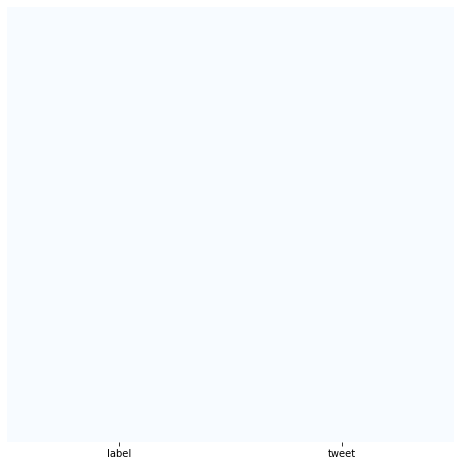

In [8]:
 plt.figure(figsize=(8,8))
 sns.heatmap(df.isnull(), yticklabels = False, cbar = False, cmap="Blues")

This indicates there is no null value in the dataset

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000001C8BD266F10>]],
      dtype=object)

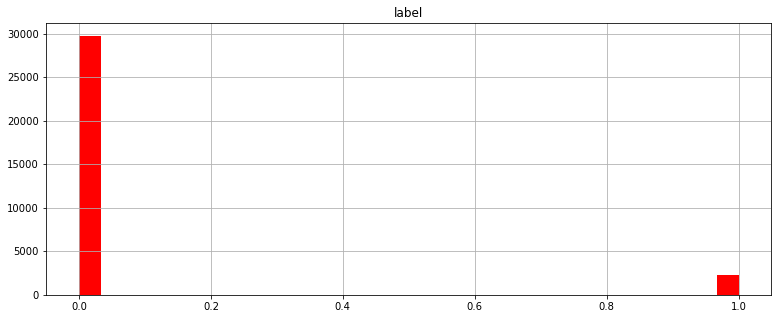

In [9]:
df.hist(bins = 30, figsize = (13,5), color = 'r')

It indicates dataset has more positive message than negative message

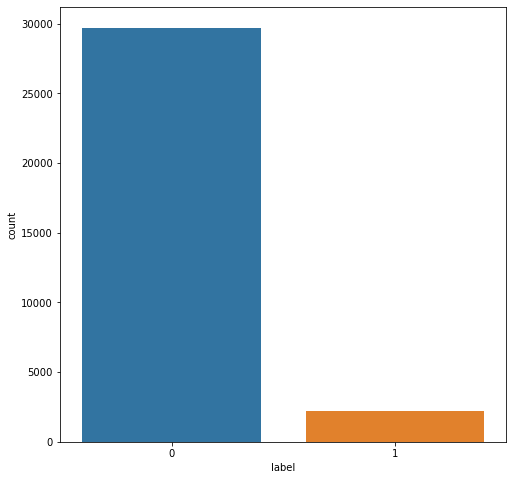

In [10]:
plt.figure(figsize=(8,8))
sns.countplot(df['label'],label='count')

Let's get the length of the messages


In [11]:
df['length']=df['tweet'].apply(len)

In [12]:
df

,label,tweet,length
0,0,@user when a father is dysfunctional and is s...,102
1,0,@user @user thanks for #lyft credit i can't us...,122
2,0,bihday your majesty,21
3,0,#model i love u take with u all the time in ...,86
4,0,factsguide: society now #motivation,39
...,...,...,...
31957,0,ate @user isz that youuu?ðððððð...,68
31958,0,to see nina turner on the airwaves trying to...,131
31959,0,listening to sad songs on a monday morning otw...,63
31960,1,"@user #sikh #temple vandalised in in #calgary,...",67


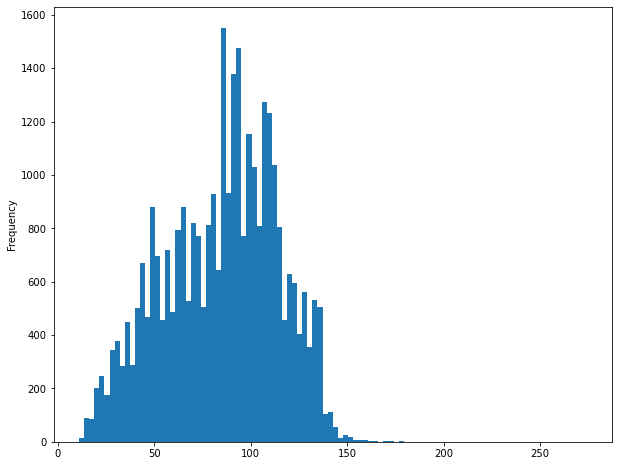

In [13]:
plt.figure(figsize=(10,8))
df['length'].plot(bins=100, kind='hist') 

In [14]:
# Let's see the shortest message
df[df['length'] == 11]['tweet'].iloc[0]

'i love you '

In [15]:
df.describe()

,label,length
count,31962.000000,31962.000000
mean,0.070146,84.739628
std,0.255397,29.455749
min,0.000000,11.000000
25%,0.000000,63.000000
50%,0.000000,88.000000
75%,0.000000,108.000000
max,1.000000,274.000000


Finding Average lenght message

In [16]:
df[df['length']==84]['tweet'].iloc[0]

'my mom shares the same bihday as @user   bihday snake! see you this weekend ð\x9f\x99\x8cð\x9f\x8f¼'

In [17]:
positive =df[df['label']==0]

In [18]:
positive

,label,tweet,length
0,0,@user when a father is dysfunctional and is s...,102
1,0,@user @user thanks for #lyft credit i can't us...,122
2,0,bihday your majesty,21
3,0,#model i love u take with u all the time in ...,86
4,0,factsguide: society now #motivation,39
...,...,...,...
31956,0,off fishing tomorrow @user carnt wait first ti...,61
31957,0,ate @user isz that youuu?ðððððð...,68
31958,0,to see nina turner on the airwaves trying to...,131
31959,0,listening to sad songs on a monday morning otw...,63


In [19]:
len(positive)

29720

In [20]:
negative = df[df['label']==1]

In [21]:
negative

,label,tweet,length
13,1,@user #cnn calls #michigan middle school 'buil...,74
14,1,no comment! in #australia #opkillingbay #se...,101
17,1,retweet if you agree!,22
23,1,@user @user lumpy says i am a . prove it lumpy.,47
34,1,it's unbelievable that in the 21st century we'...,104
...,...,...,...
31934,1,lady banned from kentucky mall. @user #jcpenn...,59
31946,1,@user omfg i'm offended! i'm a mailbox and i'...,82
31947,1,@user @user you don't have the balls to hashta...,112
31948,1,"makes you ask yourself, who am i? then am i a...",87


In [22]:
len(negative)

2242

HERE WE GO PLOTING THE WORDCLOUD :) 

In [23]:
!pip install WordCloud
from wordcloud import WordCloud

In [24]:
sentences=df['tweet'].to_list()

In [25]:
len(sentences)

31962

In [26]:
string=" ".join(sentences)

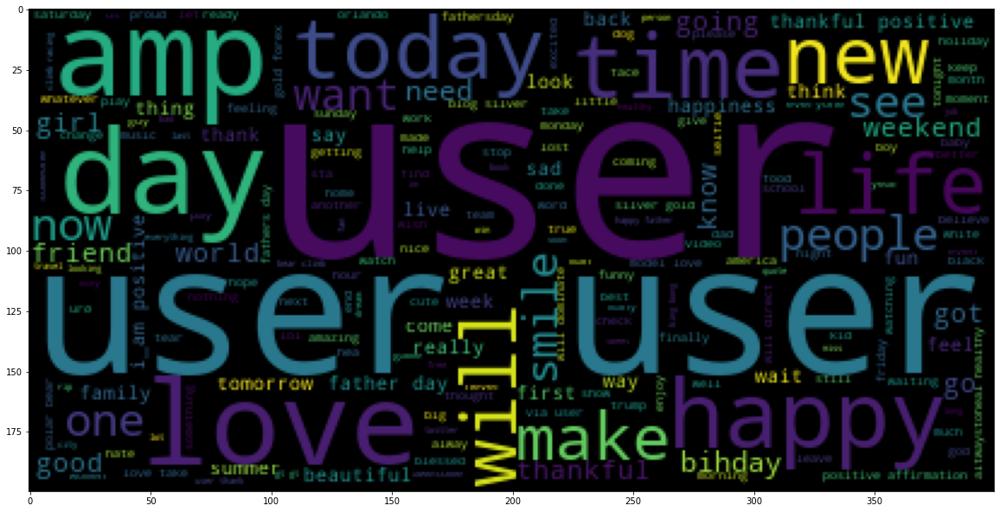

In [27]:
plt.figure(figsize=(20,20))
plt.imshow(WordCloud().generate(string))

In [28]:
negative_sent=df[df['label']==1]['tweet']

In [29]:
neg_sent=" ".join(negative_sent)

In [30]:
neg_sent

'@user #cnn calls #michigan middle school \'build the wall\' chant \'\' #tcot   no comment!  in #australia   #opkillingbay #seashepherd #helpcovedolphins #thecove  #helpcovedolphins retweet if you agree!  @user @user lumpy says i am a . prove it lumpy. it\'s unbelievable that in the 21st century we\'d need something like this. again. #neverump  #xenophobia  @user lets fight against  #love #peace  ð\x9f\x98©the white establishment can\'t have blk folx running around loving themselves and promoting our greatness   @user hey, white people: you can call people \'white\' by @user  #race  #identity #medâ\x80¦ how the #altright uses  &amp; insecurity to lure men into #whitesupremacy     @user i\'m not interested in a #linguistics that doesn\'t address #race &amp; . racism is about #power. #raciolinguistics bringsâ\x80¦ @user why not @user mocked obama for being black.  @user @user @user @user #brexit #people aren\'t protesting #trump because a #republican won-they do so because trump has fuhe

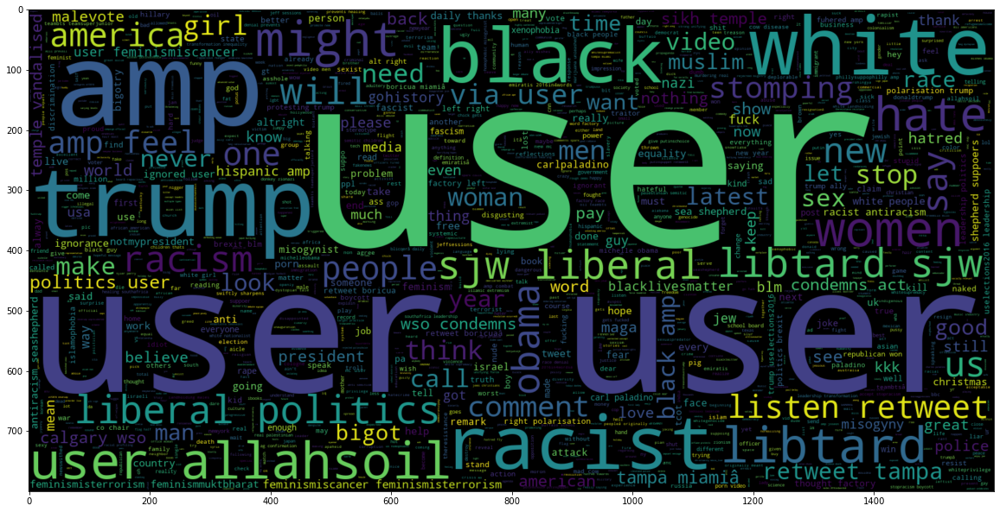

In [31]:
plt.figure(figsize=(20,20))
wc=WordCloud(max_words=2000,width=1600,height=800).generate(neg_sent)
plt.imshow(wc,interpolation='bilinear')

In [32]:
positive_sent=df[df['label']==0]['tweet']

In [33]:
positive_sent

0         @user when a father is dysfunctional and is s...
1        @user @user thanks for #lyft credit i can't us...
2                                      bihday your majesty
3        #model   i love u take with u all the time in ...
4                   factsguide: society now    #motivation
                               ...                        
31956    off fishing tomorrow @user carnt wait first ti...
31957    ate @user isz that youuu?ðððððð...
31958      to see nina turner on the airwaves trying to...
31959    listening to sad songs on a monday morning otw...
31961                     thank you @user for you follow  
Name: tweet, Length: 29720, dtype: object

In [34]:
pos_sent=" ".join(positive_sent)

In [35]:
pos_sent

' @user when a father is dysfunctional and is so selfish he drags his kids into his dysfunction.   #run @user @user thanks for #lyft credit i can\'t use cause they don\'t offer wheelchair vans in pdx.    #disapointed #getthanked   bihday your majesty #model   i love u take with u all the time in urð\x9f\x93±!!! ð\x9f\x98\x99ð\x9f\x98\x8eð\x9f\x91\x84ð\x9f\x91\x85ð\x9f\x92¦ð\x9f\x92¦ð\x9f\x92¦    factsguide: society now    #motivation [2/2] huge fan fare and big talking before they leave. chaos and pay disputes when they get there. #allshowandnogo    @user camping tomorrow @user @user @user @user @user @user @user dannyâ\x80¦ the next school year is the year for exams.ð\x9f\x98¯ can\'t think about that ð\x9f\x98\xad #school #exams   #hate #imagine #actorslife #revolutionschool #girl we won!!! love the land!!! #allin #cavs #champions #cleveland #clevelandcavaliers  â\x80¦   @user @user welcome here !  i\'m   it\'s so #gr8 !   â\x86\x9d #ireland consumer price index (mom) climbed from pre

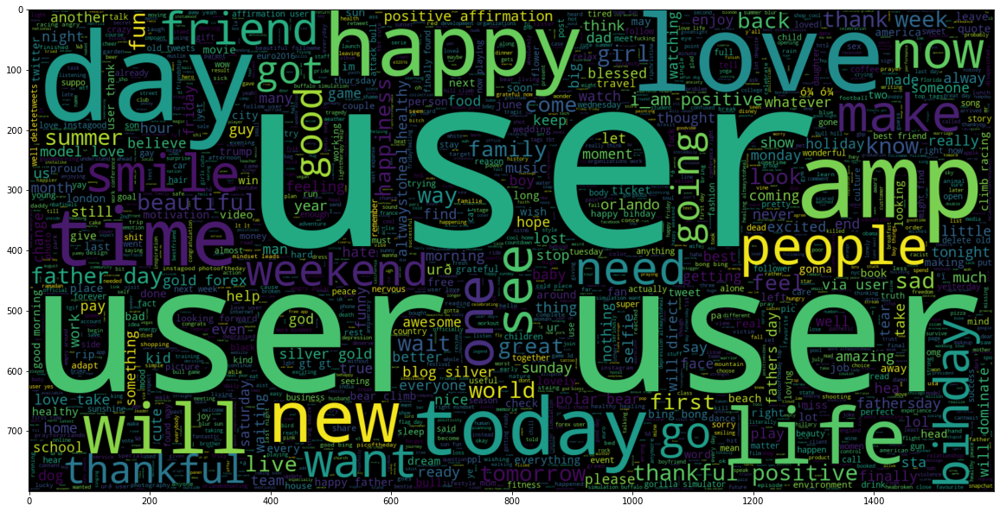

In [36]:
plt.figure(figsize=(20,20))
wc=WordCloud(max_words=2000,width=1600,height=800).generate(pos_sent)
plt.imshow(wc,interpolation='bilinear')

# PERFORM DATA CLEANING - REMOVE PUNCTUATION FROM TEXT

In [37]:
import string
string.punctuation

'!"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~'

In [38]:
Test = 'Good morning beautiful people :)... I am having fun learning Machine learning and AI!!'

In [39]:
test_punc_remove=[char for char in Test if char not in string.punctuation]

In [40]:
test_words="".join(test_punc_remove)

In [41]:
test_words

'Good morning beautiful people  I am having fun learning Machine learning and AI'

In [42]:
# we will implement our tweet to remove punctuation
remove_punc=[]
for line in df['tweet'].to_list():
    for char in line:
        if char not in string.punctuation:
            remove_punc.append(char)

In [43]:
removed_words="".join(remove_punc)
removed_words

' user when a father is dysfunctional and is so selfish he drags his kids into his dysfunction   runuser user thanks for lyft credit i cant use cause they dont offer wheelchair vans in pdx    disapointed getthanked  bihday your majestymodel   i love u take with u all the time in urð\x9f\x93± ð\x9f\x98\x99ð\x9f\x98\x8eð\x9f\x91\x84ð\x9f\x91\x85ð\x9f\x92¦ð\x9f\x92¦ð\x9f\x92¦   factsguide society now    motivation22 huge fan fare and big talking before they leave chaos and pay disputes when they get there allshowandnogo   user camping tomorrow user user user user user user user dannyâ\x80¦the next school year is the year for examsð\x9f\x98¯ cant think about that ð\x9f\x98\xad school exams   hate imagine actorslife revolutionschool girlwe won love the land allin cavs champions cleveland clevelandcavaliers  â\x80¦  user user welcome here   im   its so gr8   â\x86\x9d ireland consumer price index mom climbed from previous 02 to 05 in may   blog silver gold forexwe are so selfish orlando stan

# DATA CLEANING - REMOVE STOPWORDS

In [44]:
import nltk # Natural Language tool kit 
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to C:\Users\PRASATH
[nltk_data]     K\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [45]:
# You have to download stopwords Package to execute this command
from nltk.corpus import stopwords
stopwords.words('english')

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

In [46]:
df_punc_removed_join_clean =[word for word in removed_words.split() if word.lower() not in stopwords.words('english')]             # Only important (no so common) words are left

In [47]:
df_punc_removed_join_clean

['user',
 'father',
 'dysfunctional',
 'selfish',
 'drags',
 'kids',
 'dysfunction',
 'runuser',
 'user',
 'thanks',
 'lyft',
 'credit',
 'cant',
 'use',
 'cause',
 'dont',
 'offer',
 'wheelchair',
 'vans',
 'pdx',
 'disapointed',
 'getthanked',
 'bihday',
 'majestymodel',
 'love',
 'u',
 'take',
 'u',
 'time',
 'urð\x9f\x93±',
 'ð\x9f\x98\x99ð\x9f\x98\x8eð\x9f\x91\x84ð\x9f\x91',
 'ð\x9f\x92¦ð\x9f\x92¦ð\x9f\x92¦',
 'factsguide',
 'society',
 'motivation22',
 'huge',
 'fan',
 'fare',
 'big',
 'talking',
 'leave',
 'chaos',
 'pay',
 'disputes',
 'get',
 'allshowandnogo',
 'user',
 'camping',
 'tomorrow',
 'user',
 'user',
 'user',
 'user',
 'user',
 'user',
 'user',
 'dannyâ\x80¦the',
 'next',
 'school',
 'year',
 'year',
 'examsð\x9f\x98¯',
 'cant',
 'think',
 'ð\x9f\x98\xad',
 'school',
 'exams',
 'hate',
 'imagine',
 'actorslife',
 'revolutionschool',
 'girlwe',
 'love',
 'land',
 'allin',
 'cavs',
 'champions',
 'cleveland',
 'clevelandcavaliers',
 'â\x80¦',
 'user',
 'user',
 'welco

In [48]:
data=" ".join(df_punc_removed_join_clean)
data

'user father dysfunctional selfish drags kids dysfunction runuser user thanks lyft credit cant use cause dont offer wheelchair vans pdx disapointed getthanked bihday majestymodel love u take u time urð\x9f\x93± ð\x9f\x98\x99ð\x9f\x98\x8eð\x9f\x91\x84ð\x9f\x91 ð\x9f\x92¦ð\x9f\x92¦ð\x9f\x92¦ factsguide society motivation22 huge fan fare big talking leave chaos pay disputes get allshowandnogo user camping tomorrow user user user user user user user dannyâ\x80¦the next school year year examsð\x9f\x98¯ cant think ð\x9f\x98\xad school exams hate imagine actorslife revolutionschool girlwe love land allin cavs champions cleveland clevelandcavaliers â\x80¦ user user welcome im gr8 â\x86\x9d ireland consumer price index mom climbed previous 02 05 may blog silver gold forexwe selfish orlando standwithorlando pulseshooting orlandoshooting biggerproblems selfish heabreaking values love get see daddy today 80days gettingfeduser cnn calls michigan middle school build wall chant tcot comment australia

# COUNT VECTORIZATION (TOKENIZATION)

In [49]:
from sklearn.feature_extraction.text import CountVectorizer
sample_data = ['This is the first paper.','This document is the second paper.','And this is the third one.','Is this the first paper?']

In [50]:
vectorizer=CountVectorizer()
X=vectorizer.fit_transform(sample_data)

In [51]:
print(vectorizer.get_feature_names())

['and', 'document', 'first', 'is', 'one', 'paper', 'second', 'the', 'third', 'this']


In [52]:
X.toarray()

array([[0, 0, 1, 1, 0, 1, 0, 1, 0, 1],
       [0, 1, 0, 1, 0, 1, 1, 1, 0, 1],
       [1, 0, 0, 1, 1, 0, 0, 1, 1, 1],
       [0, 0, 1, 1, 0, 1, 0, 1, 0, 1]], dtype=int64)

# PIPELINE TO REMOVE PUNCTUATIONS, STOPWORDS AND PERFORM COUNT VECTORIZATION

In [53]:
def message_cleaning(message):
    Test_punc_removed = [char for char in message if char not in string.punctuation]
    Test_punc_removed_join = ''.join(Test_punc_removed)
    Test_punc_removed_join_clean = [word for word in Test_punc_removed_join.split() if word.lower() not in stopwords.words('english')]
    return Test_punc_removed_join_clean

In [54]:
tweets_df_clean = df['tweet'].apply(message_cleaning)

In [55]:
print(tweets_df_clean[5])

['22', 'huge', 'fan', 'fare', 'big', 'talking', 'leave', 'chaos', 'pay', 'disputes', 'get', 'allshowandnogo']


In [56]:
print(df['tweet'][5]) 

[2/2] huge fan fare and big talking before they leave. chaos and pay disputes when they get there. #allshowandnogo  


In [57]:
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer(analyzer = message_cleaning,dtype='uint8')
tweets_countvectorizer = vectorizer.fit_transform(df['tweet']).toarray()

In [58]:
print(vectorizer.get_feature_names())

['0', '0000001', '00027', '001', '0035', '00h30', '01', '0115', '0161', '019', '01926889917', '02', '0265', '0266808099', '02900', '03', '030916', '03111880779', '032', '033', '0345', '039', '04', '045', '04k', '05', '0506823156', '06', '06052016', '0606', '060616', '0608', '0608wed', '0609', '0610', '061116', '0612', '0613', '0616', '0617', '0618', '0618saturday7monthscouple', '0618â\x99¡', '0620', '06202016', '0622', '0624', '06Â', '07', '07000', '07040', '07044', '07150', '07190', '07400', '07468', '07500', '076', '07788427999', '07800', '07840', '07850', '07870', '07900', '07930', '07950', '08', '0806', '080616', '088b', '08â\x80¦', '09', '09062016', '0933m', '09600', '0k', '0shares', '0tolerancemovie', '0ð\x9f\x98¥â\x98¹ï¸\x8f', '1', '10', '100', '1000', '100000', '10003', '10007', '1000gifts', '1000th', '1000x', '1000yr', '1000â\x82¬', '1001', '1001000s', '10014', '10021', '10025', '10040', '100616', '10064', '100d', '100daysofcode', '100daysofpigpaintings', '100daysoftea', '100f

In [59]:
tweets_countvectorizer.shape

(31962, 47386)

In [60]:
tweets_countvectorizer

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

In [61]:
tweets = pd.DataFrame(tweets_countvectorizer)

In [62]:
X = tweets

In [63]:
X

,0,1,2,3,4,5,6,7,8,9,...,47376,47377,47378,47379,47380,47381,47382,47383,47384,47385
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31957,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
31958,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
31959,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
31960,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [64]:
y = df['label']

#  TRAINING MODEL

## NAIVE BAYES

In [65]:
X.shape

(31962, 47386)

In [66]:
y.shape

(31962,)

In [67]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# TRAINED MODEL PERFORMANCE  

In [69]:
from sklearn.naive_bayes import MultinomialNB
NB_classifier=MultinomialNB()
NB_classifier.fit(X_train,y_train)

MultinomialNB()

In [70]:
from sklearn.metrics import confusion_matrix,classification_report

Text(51.0, 0.5, 'Actual label')

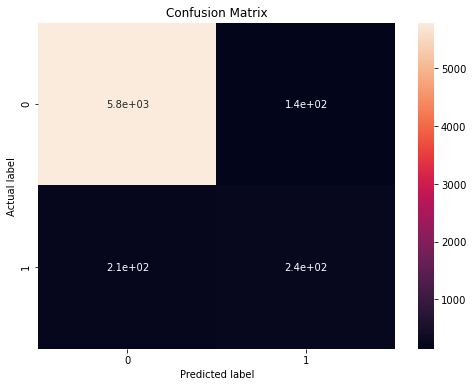

In [72]:
# Predicting the Test set results
y_predict_test = NB_classifier.predict(X_test)
plt.figure(figsize=(8,6))
cm=confusion_matrix(y_test,y_predict_test)
sns.heatmap(cm,annot=True)
plt.title('Confusion Matrix',y=1.1)
plt.xlabel('Predicted label')
plt.ylabel('Actual label')

In [73]:
print(classification_report(y_test, y_predict_test))

              precision    recall  f1-score   support

           0       0.96      0.98      0.97      5939
           1       0.63      0.53      0.58       454

    accuracy                           0.94      6393
   macro avg       0.80      0.75      0.77      6393
weighted avg       0.94      0.94      0.94      6393



In [74]:
from sklearn.metrics import accuracy_score

In [75]:
print('Accuracy :',accuracy_score(y_test,y_predict_test))

Accuracy : 0.9441576724542469


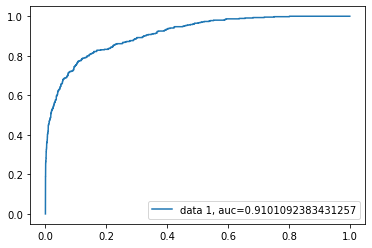

In [77]:
from sklearn import metrics
y_pred_proba_nb = NB_classifier.predict_proba(X_test)[::,1]
fpr_nb, tpr_nb, _ = metrics.roc_curve(y_test,  y_pred_proba_nb)
auc = metrics.roc_auc_score(y_test, y_pred_proba_nb)
plt.plot(fpr_nb,tpr_nb,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.show()

# Logistic Regression

In [78]:
from sklearn.linear_model import LogisticRegression

In [79]:
lr=LogisticRegression()
lr.fit(X_train,y_train)
y_predict=lr.predict(X_test)

Text(51.0, 0.5, 'Actual label')

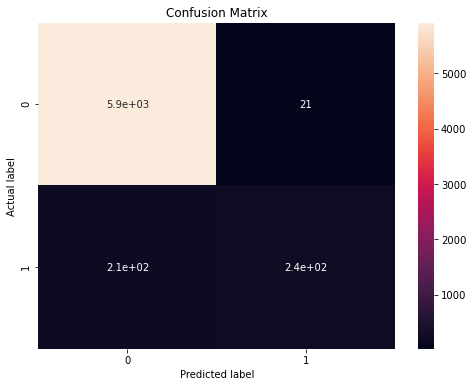

In [80]:
plt.figure(figsize=(8,6))
cm_log=confusion_matrix(y_test,y_predict)
sns.heatmap(cm_log,annot=True)
plt.title('Confusion Matrix',y=1.1)
plt.xlabel('Predicted label')
plt.ylabel('Actual label')

In [81]:
print('Logistic Regression Accuracy :',accuracy_score(y_test,y_predict))

Logistic Regression Accuracy : 0.9632410448928516


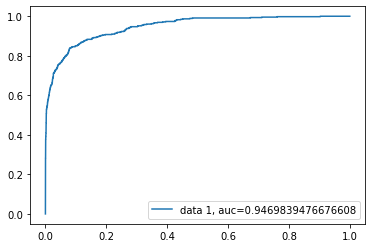

In [82]:
from sklearn import metrics
y_pred_proba_log = lr.predict_proba(X_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba_log)
auc = metrics.roc_auc_score(y_test, y_pred_proba_log)
plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.legend(loc=4)
plt.show()

# Support Vector Machine

In [ ]:
from sklearn import svm
clf=svm.SVC(kernel='polynomial')
clf.fit(X_train,y_train)
clf_pred=clf.predict(X_test)

In [ ]:
plt.figure(figsize=(8,6))
plt.title('Confusion Matric,y=1.1')
plt.xlabel('Predicted label')
plt.ylabel('Actual label')
cm_svm=Confusion_matrix(y_test,clf_pred)
sns.heatmap(cm_svm,annot=True)

In [ ]:
print('Support Vector machine Accuracy :',accuracy_score(X_test,clf_pred))

# Decission Trees

In [ ]:
from sklearn.trees import DecisionTreeClassifier
dtc=DecissionTreeClassifier(criterion='entropy',max_depth=5)
dtc.fit(X_train,y_train)
y_pred_dtc=dtc.predict(X_test)

In [ ]:
print('Decision Tree Accuracy :',accuracy(y_test,y_pred_dtc))

# Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier
rfc=RandomForestClassifier(n_estimators=100)
rfc.fit(X_train.y_train)
y_predict_rfc=rfc.predict(X_test)

In [ ]:
print('Random Forest Classifier Accuracy :',accuracy_score(X_test,y_predict_rfc))

# ADA BOOST

In [ ]:
from sklearn.ensemble import AdaBoostClassifier
abc=AdaBoostClassifier(n_estimators=50,learning_rate=1)
model=abc.fit(X_train,y_train)
y_predict_abc=model.predict(X_test)
print('Ada Boost Classifier Accuarcy:',accuracy_score(y_test,y_predict_abc))

#### ADA BOOST using svc as base estimators

In [ ]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.svm import SVC
svc=SVC(probability=True,kernel='linear')
abc=AdaBoostClassifier(n_estimators=50,base_estimator=svc,learning_rate=1)
model=abc.fit(X_train,y_train)
y_predict_abc=model.predict(X_test)
print('Ada Boost Classifier Accuarcy:',accuracy_score(y_test,y_predict_abc))

# XG BOOST

In [ ]:
import xgboost as xgb
from sklearn.classifier import XGBClassifier
from sklearn.grid_search import GridSearchCV

In [ ]:
import matplotlib.pylab as plt
from matplotlib.pylab import rcParams
rcParams['figure.figsize'] = 12, 4

In [ ]:
def modelfit(alg,X_train,predictors,useTrainCV=True,cv_folds=5,early_stopping_rounds=50):
    if useTrainCV:
        xgb_params=alg.get_xgb_params()
        xgtrain=xgbDMatrix(X_train,y_train)
        cv_results=xgb.cv(xgb_params,xgbtrain,num_boost_round=get_xgb_params()['n_estimators'],nfold=cv_folds,
                          metrics='auc', early_stopping_rounds=early_stopping_rounds, show_progress=False)
    alg.set_params(n_estimators=cvresult.shape[0])
    alg.fit(X_train,y_train,eval_metric='auc')
    y_predict_xgb = alg.predict(X_test)
    X_predprob = alg.predict_proba(X_test)
    
    print("\nModel Report")
    print("Accuracy : %.4g" % metrics.accuracy_score(y_test,y_predict_xgb)
    print("AUC Score (Train): %f" % metrics.roc_auc_score(y_test, X_predprob))
                    
    feat_imp = pd.Series(alg.booster().get_fscore()).sort_values(ascending=False)
    feat_imp.plot(kind='bar', title='Feature Importances')
    plt.ylabel('Feature Importance Score')